### Importing libraries

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

warnings.filterwarnings("ignore")
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

from wordcloud import WordCloud
from prettytable import PrettyTable
from sklearn import decomposition
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics import roc_curve, auc
from matplotlib import pyplot
from scipy.sparse import coo_matrix
from scipy.sparse import csr_matrix
from scipy.sparse import hstack
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import Normalizer
import itertools
from sklearn import tree
import pydotplus
import graphviz
from numpy import sort
import scipy

# 1. Importing Data

In [2]:
X = pd.read_csv('DonorsChoose_processed.csv')
project_data = pd.read_csv('train_data.csv')
project_data=project_data[0:50000]
y = project_data['project_is_approved'].values

# 3. Vectorizing data

- https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/

## 3.2 vectorizing state

In [3]:
vec_state = CountVectorizer(min_df=10)
X_state=vec_state.fit_transform(X['school_state'].values) # fit has to happen only on train data


print("After vectorizations")
print(X_state.shape)
print(vec_state.get_feature_names())

After vectorizations
(50000, 51)
['ak', 'al', 'ar', 'az', 'ca', 'co', 'ct', 'dc', 'de', 'fl', 'ga', 'hi', 'ia', 'id', 'il', 'in', 'ks', 'ky', 'la', 'ma', 'md', 'me', 'mi', 'mn', 'mo', 'ms', 'mt', 'nc', 'nd', 'ne', 'nh', 'nj', 'nm', 'nv', 'ny', 'oh', 'ok', 'or', 'pa', 'ri', 'sc', 'sd', 'tn', 'tx', 'ut', 'va', 'vt', 'wa', 'wi', 'wv', 'wy']


## 3.3 vectorizing teacher_prefix

In [4]:
vec_state = CountVectorizer(min_df=10)
X_teacher=vec_state.fit_transform(X['teacher_prefix'].values) # fit has to happen only on train data


print("After vectorizations")
print(X_teacher.shape)
print(vec_state.get_feature_names())

After vectorizations
(50000, 4)
['mr', 'mrs', 'ms', 'teacher']


## 3.4 vectorizing project_grade

In [5]:
vec_state = CountVectorizer(min_df=10)
X_grade=vec_state.fit_transform(X['project_grade_category'].values) # fit has to happen only on train data


print("After vectorizations")
print(X_grade.shape)
print(vec_state.get_feature_names())

After vectorizations
(50000, 3)
['12', 'grades', 'prek']


## 3.6 vectorizing project_category

In [6]:
vec_state = CountVectorizer(min_df=10)
X_category=vec_state.fit_transform(X['clean_categories'].values) # fit has to happen only on train data


print("After vectorizations")
print(X_category.shape)
print(vec_state.get_feature_names())

After vectorizations
(50000, 9)
['appliedlearning', 'care_hunger', 'health_sports', 'history_civics', 'literacy_language', 'math_science', 'music_arts', 'specialneeds', 'warmth']


## 3.7 vectorizing project_subcategory

In [7]:
vec_state = CountVectorizer(min_df=10)
X_subcategory=vec_state.fit_transform(X['clean_subcategories'].values) # fit has to happen only on train data


print("After vectorizations")
print(X_subcategory.shape)
print(vec_state.get_feature_names())

After vectorizations
(50000, 30)
['appliedsciences', 'care_hunger', 'charactereducation', 'civics_government', 'college_careerprep', 'communityservice', 'earlydevelopment', 'economics', 'environmentalscience', 'esl', 'extracurricular', 'financialliteracy', 'foreignlanguages', 'gym_fitness', 'health_lifescience', 'health_wellness', 'history_geography', 'literacy', 'literature_writing', 'mathematics', 'music', 'nutritioneducation', 'other', 'parentinvolvement', 'performingarts', 'socialsciences', 'specialneeds', 'teamsports', 'visualarts', 'warmth']


## 3.8 Price

In [8]:

X_price = X['price'].values.reshape(1,-1).T 

print("After vectorizations")
print(X_price.shape)

After vectorizations
(50000, 1)


## 3.9 teacher no of previously posted projects

In [11]:
X_posted = X['teacher_number_of_previously_posted_projects'].values.reshape(1,-1).T 

print("After vectorizations")
print(X_posted.shape)

After vectorizations
(50000, 1)


## 3.10 resource summary

In [13]:
X_digit = X['Is_digit_present'].values.reshape(1,-1).T 

print("After vectorizations")
print(X_digit.shape)

After vectorizations
(50000, 1)


## 3.11 quantity

In [14]:
X_quantity = X['quantity'].values.reshape(1,-1).T 

print("After vectorizations")
print(X_quantity.shape)


After vectorizations
(50000, 1)


## TFIDF Vectorization of Clean_essay

In [15]:
vec_state = TfidfVectorizer(min_df=10, max_features=5000)
X_essay=vec_state.fit_transform(X['clean_essay'].values) # fit has to happen only on train data


print("After vectorizations")
print(X_essay.shape)


After vectorizations
(50000, 5000)


## TFIDF Vectorization of Clean_title

In [16]:
vec_state = TfidfVectorizer(min_df=10, max_features=5000)
X_title=vec_state.fit_transform(X['clean_title'].values) # fit has to happen only on train data


print("After vectorizations")
print(X_title.shape)


After vectorizations
(50000, 2039)


# Concatenation of all the vectorized data

In [17]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039

X_data = hstack((X_state,X_teacher,X_grade,X_category,X_subcategory,X_price,X_posted,X_digit,X_quantity,X_essay,X_title))

print("Final Data matrix")
print(X_data.shape)

Final Data matrix
(50000, 7140)


In [134]:
from sklearn.feature_selection import SelectKBest, chi2
X_5k_best = SelectKBest(chi2, k=5000).fit_transform(X_data, y)

print("Final Data matrix")
print(X_5k_best.shape)

Final Data matrix
(50000, 5000)


In [19]:
from sklearn.cluster import KMeans

In [43]:
score=[]
for i in range(2,11):
    kmeans = KMeans(n_clusters=i, random_state=0).fit(X_5k_best)
    score.append(kmeans.inertia_)


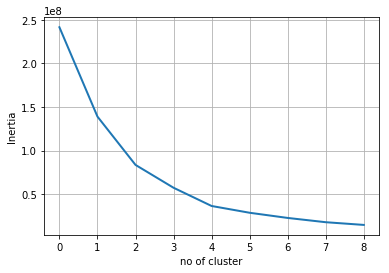

In [50]:
plt.plot(score, linewidth=2)
plt.grid()
plt.xlabel('no of cluster')
plt.ylabel('Inertia')
plt.show()

In [22]:
kmeans = KMeans(n_clusters=2, random_state=0).fit(X_5k_best)

In [23]:
count=0
title=[]
state=[]
price=[]
grade=[]
prefix=[]
category=[]
i=0
for i in range(3000):
    if(kmeans.predict(X_5k_best[i])==0):
        title.append(X['clean_title'][i])
        state.append(X['school_state'][i])
        price.append(X['price'][i])
        grade.append(X['project_grade_category'][i])
        prefix.append(X['teacher_prefix'][i])
        category.append(X['clean_categories'][i])
        count=count+1
        if(count==5):
            break;

In [24]:
from pandas import DataFrame
Cluster_1 = {'Title': title,'State': state,'Price':price,'Project grade':grade,
             'Teacher prefix':prefix , 'Subject Category':category       
        }
df_Cluster_1 = DataFrame(Cluster_1,columns= ['Title', 'State','Price','Project grade','Teacher prefix','Subject Category'])

In [25]:
df_Cluster_1

,Title,State,Price,Project grade,Teacher prefix,Subject Category
0,wiggling way success,OH,749.42,Grades 3-5,Ms.,Health_Sports
1,4th grade french immersion class ipads,LA,660.84,Grades 3-5,Teacher,Literacy_Language Math_Science
2,pressing mastery flood,LA,1366.91,Grades PreK-2,Mrs.,Math_Science
3,stand learn,NY,869.00,Grades 6-8,Mr.,Math_Science History_Civics
4,picnic table make us able,CT,748.97,Grades 6-8,Ms.,Health_Sports


### In cluster 1 we can see the prices are higher than the prices of cluster 2

In [28]:
count=0
title=[]
state=[]
price=[]
grade=[]
prefix=[]
category=[]
i=0
for i in range(3000):
    if(kmeans.predict(X_5k_best[i])==1):
        title.append(X['clean_title'][i])
        state.append(X['school_state'][i])
        price.append(X['price'][i])
        grade.append(X['project_grade_category'][i])
        prefix.append(X['teacher_prefix'][i])
        category.append(X['clean_categories'][i])
        count=count+1
        if(count==5):
            break;

In [29]:
Cluster_2 = {'Title': title,'State': state,'Price':price,'Project grade':grade,
             'Teacher prefix':prefix,'Subject Category':category        
        }
df_Cluster_2 = DataFrame(Cluster_2,columns= ['Title', 'State','Price','Project grade','Teacher prefix','Subject Category'])

In [30]:
df_Cluster_2

,Title,State,Price,Project grade,Teacher prefix,Subject Category
0,educational support english learners home,IN,154.60,Grades PreK-2,Mrs.,Literacy_Language
1,wanted projector hungry learners,FL,299.00,Grades 6-8,Mr.,History_Civics Health_Sports
2,soccer equipment awesome middle school students,AZ,516.85,Grades 6-8,Ms.,Health_Sports
3,techie kindergarteners,KY,232.90,Grades PreK-2,Mrs.,Literacy_Language Math_Science
4,interactive math tools,TX,67.98,Grades PreK-2,Mrs.,Math_Science


### in cluster 2 we can see the prices are lower than the prices of cluster 1

In [79]:
#selecting the false positive data points esssay words
words_P=[]
words_F=[]
for i in range(50000):
    if(kmeans.predict(X_5k_best[i])==0): 
        words_P.append(X['clean_essay'][i])
    else:
        words_F.append(X['clean_essay'][i])
str1 = ''.join(str(e) for e in words_P)
str2 = ''.join(str(e) for e in words_F)


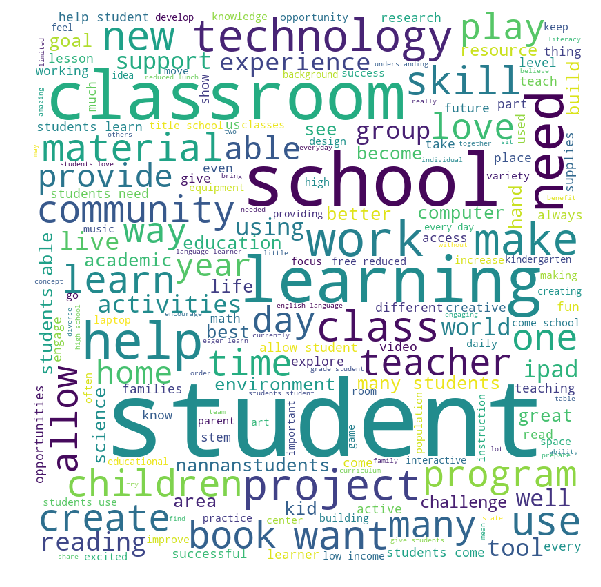

In [80]:
#code copied from -https://www.geeksforgeeks.org/generating-word-cloud-python/
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(str1) 

# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

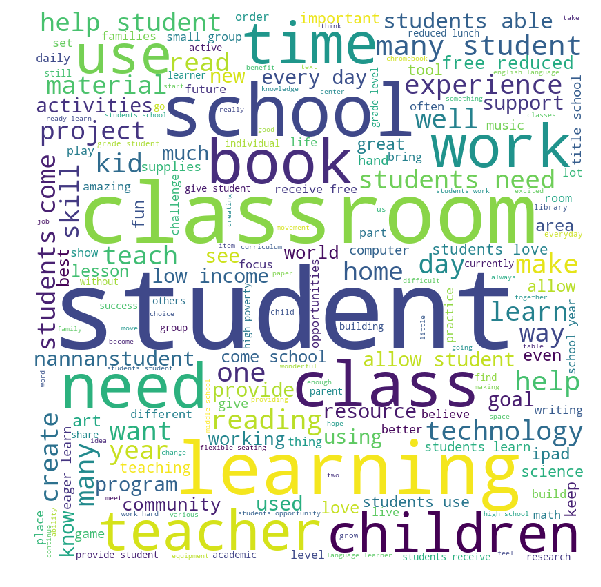

In [81]:
#code copied from -https://www.geeksforgeeks.org/generating-word-cloud-python/
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(str2) 

# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

## Agglomerative clustering

In [32]:
from sklearn.cluster import AgglomerativeClustering

In [160]:
X_5k_best=X_5k_best[0:30000]
print(X_5k_best.shape)

(30000, 5000)


In [40]:
clustering = AgglomerativeClustering(n_clusters=2).fit(X_5k_best.toarray())

In [58]:
count=0
title=[]
state=[]
price=[]
grade=[]
prefix=[]
category=[]
i=0
for i in range(3000):
    if(clustering.labels_[i]==0):
        title.append(X['clean_title'][i])
        state.append(X['school_state'][i])
        price.append(X['price'][i])
        grade.append(X['project_grade_category'][i])
        prefix.append(X['teacher_prefix'][i])
        category.append(X['clean_categories'][i])
        count=count+1
        if(count==5):
            break;

In [59]:
Cluster_2 = {'Title': title,'State': state,'Price':price,'Project grade':grade,
             'Teacher prefix':prefix,'Subject Category':category        
        }
df_Cluster_2 = DataFrame(Cluster_2,columns= ['Title', 'State','Price','Project grade','Teacher prefix','Subject Category'])
df_Cluster_2

,Title,State,Price,Project grade,Teacher prefix,Subject Category
0,wiggling way success,OH,749.42,Grades 3-5,Ms.,Health_Sports
1,4th grade french immersion class ipads,LA,660.84,Grades 3-5,Teacher,Literacy_Language Math_Science
2,pressing mastery flood,LA,1366.91,Grades PreK-2,Mrs.,Math_Science
3,stand learn,NY,869.00,Grades 6-8,Mr.,Math_Science History_Civics
4,picnic table make us able,CT,748.97,Grades 6-8,Ms.,Health_Sports


### In cluster 1 we can see the prices are higher than the prices of cluster 2, and the cluster is similar to the cluster we obtained by k means algorithm

In [60]:
count=0
title=[]
state=[]
price=[]
grade=[]
prefix=[]
category=[]
i=0
for i in range(3000):
    if(clustering.labels_[i]==1):
        title.append(X['clean_title'][i])
        state.append(X['school_state'][i])
        price.append(X['price'][i])
        grade.append(X['project_grade_category'][i])
        prefix.append(X['teacher_prefix'][i])
        category.append(X['clean_categories'][i])
        count=count+1
        if(count==5):
            break;

In [61]:
Cluster_2 = {'Title': title,'State': state,'Price':price,'Project grade':grade,
             'Teacher prefix':prefix,'Subject Category':category        
        }
df_Cluster_2 = DataFrame(Cluster_2,columns= ['Title', 'State','Price','Project grade','Teacher prefix','Subject Category'])
df_Cluster_2

,Title,State,Price,Project grade,Teacher prefix,Subject Category
0,educational support english learners home,IN,154.60,Grades PreK-2,Mrs.,Literacy_Language
1,wanted projector hungry learners,FL,299.00,Grades 6-8,Mr.,History_Civics Health_Sports
2,soccer equipment awesome middle school students,AZ,516.85,Grades 6-8,Ms.,Health_Sports
3,techie kindergarteners,KY,232.90,Grades PreK-2,Mrs.,Literacy_Language Math_Science
4,interactive math tools,TX,67.98,Grades PreK-2,Mrs.,Math_Science


### In cluster 2 we can see the prices are lower than the prices of cluster 1, and the cluster is similar to the cluster we obtained by k means algorithm

In [63]:
#selecting the false positive data points esssay words
words_P=[]
words_F=[]
for i in range(3000):
    if(clustering.labels_[i]==0): 
        words_P.append(X['clean_essay'][i])
    else:
        words_F.append(X['clean_essay'][i])
str1 = ''.join(str(e) for e in words_P)
str2 = ''.join(str(e) for e in words_F)


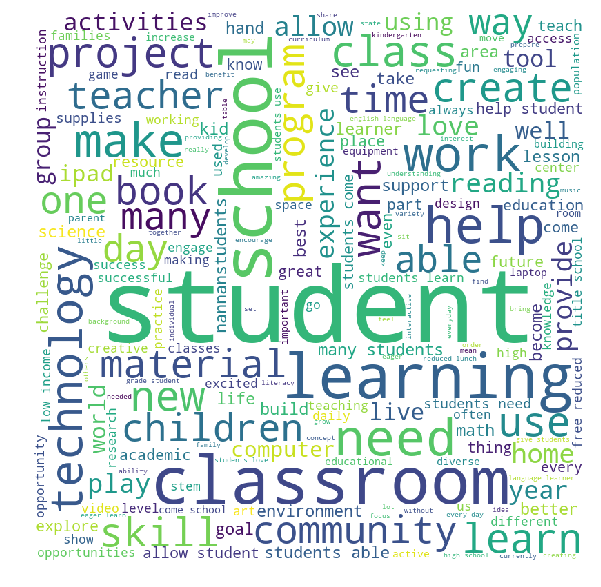

In [64]:
#code copied from -https://www.geeksforgeeks.org/generating-word-cloud-python/
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(str1) 

# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

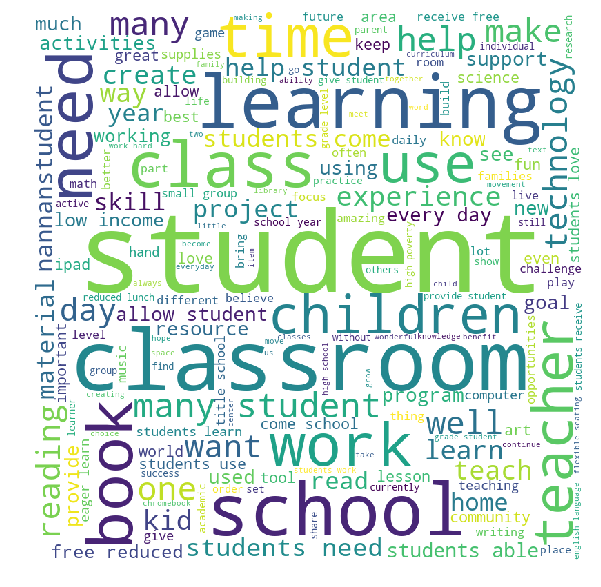

In [65]:
#code copied from -https://www.geeksforgeeks.org/generating-word-cloud-python/
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(str2) 

# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

## DBSCAN clustering

In [66]:
from sklearn.cluster import DBSCAN

In [135]:
X_5k_best=X_5k_best[0:30000]
print(X_5k_best.shape)

(30000, 5000)


In [71]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=5001).fit(X_5k_best)
distances, indices = neigh.kneighbors(X_5k_best,n_neighbors=5001)

In [94]:
di=distances[:,5000]
index=indices[:,5000]


In [97]:
MinPts_Dist = {'distance': di,'Indices': index }     
                                                    
MinPts_Distance = DataFrame(MinPts_Dist,columns= ['distance','Indices' ])
MinPts_Distance.head()

,distance,Indices
0,80.737773,2914
1,118.407100,527
2,247.643442,1086
3,93.479493,2954
4,84.784073,1198


In [99]:
MinPts_Distance.sort_values(by='distance',inplace=True)
MinPts_Distance.head()

,distance,Indices
2541,75.921494,2371
1458,75.995792,2987
2007,76.074658,2904
1079,76.192048,749
1800,76.194583,913


In [100]:
di=MinPts_Distance['distance'].values
index=MinPts_Distance['Indices'].values

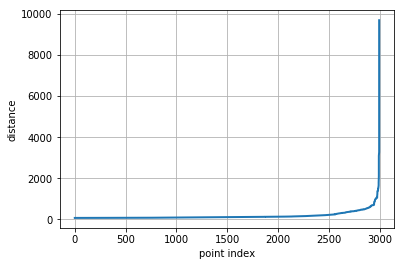

In [118]:
plt.plot(sort(index),di,scalex='True', scaley='False',linewidth=2)
plt.grid()
plt.xlabel('point index')
plt.ylabel('distance')
plt.show()

In [150]:
db = DBSCAN(eps=500, min_samples=5001).fit(X_5k_best)

In [155]:
count=0
title=[]
state=[]
price=[]
grade=[]
prefix=[]
category=[]
i=0
for i in range(3000):
    if(db.labels_[i]==0):
        title.append(X['clean_title'][i])
        state.append(X['school_state'][i])
        price.append(X['price'][i])
        grade.append(X['project_grade_category'][i])
        prefix.append(X['teacher_prefix'][i])
        category.append(X['clean_categories'][i])
        count=count+1
        if(count==5):
            break;

In [156]:
Cluster_2 = {'Title': title,'State': state,'Price':price,'Project grade':grade,
             'Teacher prefix':prefix,'Subject Category':category        
        }
df_Cluster_2 = DataFrame(Cluster_2,columns= ['Title', 'State','Price','Project grade','Teacher prefix','Subject Category'])
df_Cluster_2

,Title,State,Price,Project grade,Teacher prefix,Subject Category
0,wiggling way success,OH,749.42,Grades 3-5,Ms.,Health_Sports
1,4th grade french immersion class ipads,LA,660.84,Grades 3-5,Teacher,Literacy_Language Math_Science
2,pressing mastery flood,LA,1366.91,Grades PreK-2,Mrs.,Math_Science
3,stand learn,NY,869.00,Grades 6-8,Mr.,Math_Science History_Civics
4,picnic table make us able,CT,748.97,Grades 6-8,Ms.,Health_Sports


### In cluster 1 we can see the prices are higher than the prices of cluster 2, and the cluster is similar to the cluster we obtained by k means algorithm and Agglomerative algortihm

In [152]:
count=0
title=[]
state=[]
price=[]
grade=[]
prefix=[]
category=[]
i=0
for i in range(3000):
    if(db.labels_[i]==1):
        title.append(X['clean_title'][i])
        state.append(X['school_state'][i])
        price.append(X['price'][i])
        grade.append(X['project_grade_category'][i])
        prefix.append(X['teacher_prefix'][i])
        category.append(X['clean_categories'][i])
        count=count+1
        if(count==5):
            break;

In [154]:
Cluster_2 = {'Title': title,'State': state,'Price':price,'Project grade':grade,
             'Teacher prefix':prefix,'Subject Category':category        
        }
df_Cluster_2 = DataFrame(Cluster_2,columns= ['Title', 'State','Price','Project grade','Teacher prefix','Subject Category'])
df_Cluster_2

,Title,State,Price,Project grade,Teacher prefix,Subject Category
0,educational support english learners home,IN,154.60,Grades PreK-2,Mrs.,Literacy_Language
1,wanted projector hungry learners,FL,299.00,Grades 6-8,Mr.,History_Civics Health_Sports
2,soccer equipment awesome middle school students,AZ,516.85,Grades 6-8,Ms.,Health_Sports
3,techie kindergarteners,KY,232.90,Grades PreK-2,Mrs.,Literacy_Language Math_Science
4,interactive math tools,TX,67.98,Grades PreK-2,Mrs.,Math_Science


### In cluster 2 we can see the prices are lower than the prices of cluster 1, and the cluster is similar to the cluster we obtained by k means algorithm and Agglomerative algorithm

In [157]:
#selecting the false positive data points esssay words
words_P=[]
words_F=[]
for i in range(3000):
    if(db.labels_[i]==0): 
        words_P.append(X['clean_essay'][i])
    else:
        words_F.append(X['clean_essay'][i])
str1 = ''.join(str(e) for e in words_P)
str2 = ''.join(str(e) for e in words_F)


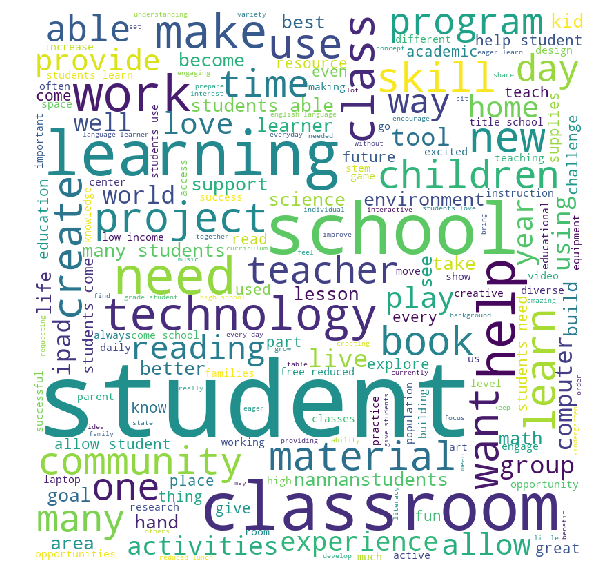

In [158]:
#code copied from -https://www.geeksforgeeks.org/generating-word-cloud-python/
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(str1) 

# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

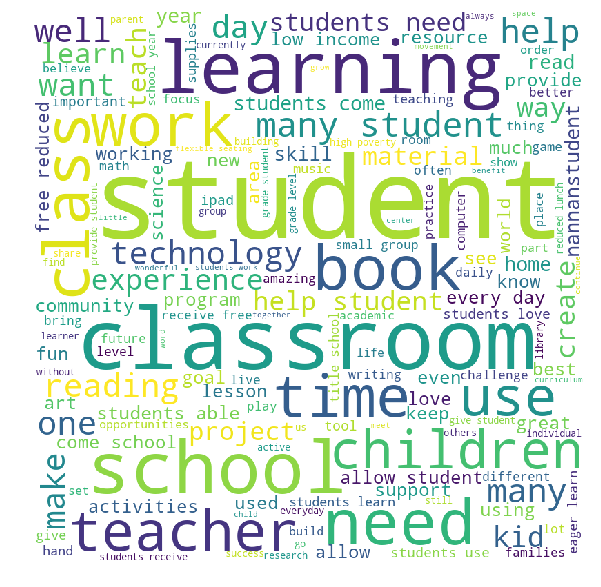

In [159]:
#code copied from -https://www.geeksforgeeks.org/generating-word-cloud-python/
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(str2) 

# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

In [1]:
import plotly.plotly as py
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()

In [2]:
values_d = [['No. of Cluster formed', 'Steps taken', 'Attribute of Cluster 1', 'Attribute of Cluster 2'],
["2",
  "<i>(---STEP 1---)First I found the best no of cluster by plotting 'No of cluster vs Inertia_'</i>         <b>(---STEP 2---) Using Elbow Knee method, I found the best No of Cluster as 2 </b>             <i>(---STEP 3---) Then I collected a few points from Cluster 1 and Cluster 2 with the help of 'kmeans.predict' method</i>        <b>(--STEP 4--) Then I created  word clouds by collecting string data from essay belonging to both the cluster</b>",
  "Most of the points in Cluster 1 are the points belonging to 'Project Approved' points",
  "Most of the points in Cluster 2 are the points belonging to 'Project Not Approved' points"
  ],
 ["2",
  "<i>(---STEP 1---)I fitted the agglomerative cluster method on to the dataset with n_cluster=2 as I have the domain knowledge that my dataset has two groups named as 'Approved' and 'Not Approved' </i>            <b>(---STEP 2---) Then I collected a few points from Cluster 1 and Cluster 2 with the help of 'clustering.labels_' method</b>        <i>(---STEP 3---) Then I created  word clouds by collecting string data from essay belonging to both the cluster</i>",
  "Most of the points in Cluster 1 are the points belonging to 'Project Not Approved' points",
  "Most of the points in Cluster 2 are the points belonging to 'Project Approved' points"   
 ],
             ["2",
  "<i>(---STEP 1---)I set MinPts as 5001 as dimension of my dataset is 5000 and the thumb of rule is to keep MinPts value > Dimension of your dataset</i>       <b>(---STEP 2---) I plotted the graph between 'Distance of 5001 Nearest Neighbour vs Point Index of 5001th point' for each point in my Dataset</b>        <i>(---STEP 3---) Using elbow knee method I found the best eps value as 500</i>       <b>(---STEP 4---) I fitted the DBSCAN method on to my Dataset and found out that 2 clusters are formed</b>    <i>(---STEP 5---) Then I collected a few points from Cluster 1 and Cluster 2 with the help of 'db.labels_' method</i>        <b>(---STEP 6---) Then I created  word clouds by collecting string data from essay belonging to both the cluster</b>",
  "Most of the points in Cluster 1 are the points belonging to 'Project Approved' points",
  "Most of the points in Cluster 2 are the points belonging to 'Project Not Approved' points"   
 ]
           ]


In [7]:
headerColor = 'grey'
rowEvenColor = 'lightgrey'
rowOddColor = 'white'


trace0 = go.Table(
  header = dict(
    values = ['<b></b>',
                  '<b>K Means</b>',
                  '<b>Agglomerative Clustering</b>',
                  '<b>DBSCAN</b>'
                  ],
    line = dict(color = '#506784'),
    fill = dict(color = headerColor),
    align = ['right'],
    font = dict(color = 'white', size = 10),
    height=40
    
  ),
  cells = dict(
    values = values_d,      
    line = dict(color = '#506784'),
    fill = dict(color = [rowOddColor,rowEvenColor,rowOddColor, rowEvenColor]),
    align = [ 'center'],
    font = dict(color = '#506784', size = 11),
    height=40
        )
)
layout = dict(width=5000, height=1000)
data = [trace0]

offline.iplot(data, layout)

# Conclusion- The clusters obtained from all of the above algorithm are almost similar